In [1]:
import xarray as xr
import datetime
import os
from glob import glob
import matplotlib.pyplot as plt
from cmocean import cm
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.colors as colors
from matplotlib import axes

# os.environ['CARTOPY_USER_BACKGROUNDS'] = '/home/shkifmjr/cartopy_images/'

import warnings
warnings.simplefilter('ignore')

## Path to data

In [2]:
path_eke_10 = '/scratch/usr/shkifmmp/master/data/ORION10/EKE/'
path_eke_10X = '/scratch/usr/shkifmmp/master/data/ORION10X/EKE/'
# path_eke_10 = '/scratch/usr/shkifmmp/master/data/ORION10/EKE/EKE_torgescript/'
# path_eke_10X = '/scratch/usr/shkifmmp/master/data/ORION10X/EKE/EKE_torgescript/'

# mask
mask_10 = xr.open_dataset('/scratch/usr/shkifmjr/NUSERDATA/ORION/10-data/meshmask/1_mesh_mask.nc', chunks={"y":100, "x":100}).tmask.isel(z=0).squeeze()
mask_10_base = xr.open_dataset('/scratch/usr/shkifmjr/NUSERDATA/ORION/10-data/meshmask/mesh_mask.nc', chunks={"y":100, "x":100}).tmask.isel(z=0).squeeze()

mask_10X = xr.open_dataset('/scratch/usr/shkmazel/masks/ORION10Xnospongeinocean/1_mesh_mask.nc', chunks={"y":100, "x":100}).tmask.isel(z=0).squeeze()
mask_10X_base = xr.open_dataset('/scratch/usr/shkmazel/masks/ORION10Xnospongeinocean/mesh_mask.nc', chunks={"y":100, "x":100}).tmask.isel(z=0).squeeze()

mask_acc = xr.open_dataset('/scratch/usr/shkifmmp/master/data/ORION10/mask/mask_nest_int_2d.nc', chunks={"y":100, "x":100})

In [13]:
eke_10_base = xr.open_mfdataset(paths = (sorted(glob(path_eke_10 + 'base/OR*199[89]*.nc')) + sorted(glob(path_eke_10 + 'base/OR*20*.nc'))[4:None]), 
                             chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10_base)

In [17]:
eke_10 = xr.open_mfdataset(paths = (sorted(glob(path_eke_10 + 'nest/1_OR*199[89]*EKE*.nc')) + sorted(glob(path_eke_10 + 'nest/1_OR*20*EKE*.nc'))[4:None]), 
                             chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10)

In [5]:
# for 2000-2017
# eke_10 = xr.open_mfdataset(paths = sorted(glob(path_eke_10 + 'nest/1_OR*20*EKE*.nc'))[4:None], 
#                              chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10)

# eke_10 = xr.open_mfdataset(paths = sorted(glob(path_eke_10 + 'nest/1_OR*20*EKE*.nc')), 
#                              chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10)

In [3]:
# eke_10 = xr.open_dataset(path_eke_10 + '1_ORION10.L46.LIM2vp.CFCSF6.MOPS.JRA.XIOS2.5.LP01-EXP05_5d_20100101_20101231_grid_EKE_k10.nc',
#                          chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10)

In [31]:
# eke_10_base = xr.open_dataset(path_eke_10 + 'ORION10.L46.LIM2vp.CFCSF6.MOPS.JRA.XIOS2.5.LP01-EXP05_5d_20100101_20101231_grid_EKE_k10.nc',
#                          chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10_base)

In [20]:
eke_10X_base = xr.open_mfdataset(paths = sorted(glob(path_eke_10X + 'FO*199[89]*EKE*.nc')) + sorted(glob(path_eke_10X + 'FO*20*EKE*.nc'))[4:None], 
                             chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10X_base)

# eke_10X_base = xr.open_mfdataset(paths = sorted(glob(path_eke_10X + 'FO*20*.nc')), 
#                              chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10X_base)

In [22]:
eke_10X = xr.open_mfdataset(paths = sorted(glob(path_eke_10X + '1_FO*199[89]*EKE*.nc')) + sorted(glob(path_eke_10X + '1_FO*20*EKE*.nc'))[4:None], 
                             chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10X)

In [24]:
eke_10X.time_counter

<xarray.DataArray 'time_counter' (time_counter: 20)>
array(['1998-07-02T12:00:00.000000000', '1999-07-02T12:00:00.000000000',
       '2000-07-01T12:00:00.000000000', '2001-07-02T12:00:00.000000000',
       '2002-07-02T12:00:00.000000000', '2003-07-02T12:00:00.000000000',
       '2004-07-01T12:00:00.000000000', '2005-07-02T12:00:00.000000000',
       '2006-07-02T12:00:00.000000000', '2007-07-02T12:00:00.000000000',
       '2008-07-01T12:00:00.000000000', '2009-07-02T12:00:00.000000000',
       '2010-07-02T12:00:00.000000000', '2011-07-02T12:00:00.000000000',
       '2012-07-01T12:00:00.000000000', '2013-07-02T12:00:00.000000000',
       '2014-07-02T12:00:00.000000000', '2015-07-02T12:00:00.000000000',
       '2016-07-01T12:00:00.000000000', '2017-07-02T12:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time_counter  (time_counter) datetime64[ns] 1998-07-02T12:00:00 ... 2017-...
    depthu        float32 93.59
Attributes:
    standard_name:  time
    long_name:      Time axis
    bounds:         time_counter_bnds
    axis:           T

In [5]:
# eke_10X = xr.open_dataset(path_eke_10X + '1_FOCI2.0-TM041_5d_20100101_20101231_grid_EKE_k10.nc',
#                          chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10X)

In [32]:
# eke_10X_base = xr.open_dataset(path_eke_10X + 'FOCI2.0-TM041_5d_20100101_20101231_grid_EKE_k10.nc',
#                          chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10X_base)

In [6]:
eke_10X

<xarray.DataArray 'vozocrtx' (time_counter: 73, y: 944, x: 3564)>
dask.array<where, shape=(73, 944, 3564), dtype=float32, chunksize=(73, 100, 100), chunktype=numpy.ndarray>
Coordinates:
  * time_counter  (time_counter) datetime64[ns] 2010-01-03T12:00:00 ... 2010-...
    nav_lon       (y, x) float32 dask.array<chunksize=(100, 100), meta=np.ndarray>
    nav_lat       (y, x) float32 dask.array<chunksize=(100, 100), meta=np.ndarray>
    depthu        float32 93.59
Dimensions without coordinates: y, x
Attributes:
    standard_name:       sea_water_x_velocity
    long_name:           ocean current along i-axis
    units:               m/s
    online_operation:    average
    interval_operation:  360 s
    interval_write:      5 d
    cell_methods:        time: mean (interval: 360 s)

In [8]:
# eke_10X = xr.open_mfdataset(paths = sorted(glob(path_eke_10X + '1_FO*20*EKE*.nc')), 
#                              chunks={"y":100, "x":100}).vozocrtx.squeeze().where(mask_10X)

## Assigning nav_lat and nav_lon as coordinates and correcting discontinuity of grid

In [25]:
lon_10_base = xr.open_mfdataset(paths = sorted(glob(path_eke_10 + 'base/OR*.nc'))[0]).nav_lon
lat_10_base = xr.open_mfdataset(paths = sorted(glob(path_eke_10 + 'base/OR*.nc'))[0]).nav_lat

In [26]:
lon_10X_base = xr.open_mfdataset(paths = sorted(glob(path_eke_10X + 'FO*20*.nc'))[0]).nav_lon
lat_10X_base = xr.open_mfdataset(paths = sorted(glob(path_eke_10X + 'FO*20*.nc'))[0]).nav_lat

In [27]:
lon_10 = xr.open_mfdataset(paths = sorted(glob(path_eke_10 + 'nest/1_OR*20*EKE*.nc'))[0]).nav_lon
lat_10 = xr.open_mfdataset(paths = sorted(glob(path_eke_10 + 'nest/1_OR*20*EKE*.nc'))[0]).nav_lat

In [28]:
lon_10X = xr.open_mfdataset(paths = sorted(glob(path_eke_10X + '1_FO*20*EKE*.nc'))[0]).nav_lon
lat_10X = xr.open_mfdataset(paths = sorted(glob(path_eke_10X + '1_FO*20*EKE*.nc'))[0]).nav_lat

In [29]:
eke_10_base = eke_10_base.assign_coords(nav_lat= lat_10_base, nav_lon=lon_10_base)
eke_10 = eke_10.assign_coords(nav_lat= lat_10, nav_lon=lon_10)

eke_10X_base = eke_10X_base.assign_coords(nav_lat= lat_10X_base, nav_lon=lon_10X_base)
eke_10X = eke_10X.assign_coords(nav_lat= lat_10X, nav_lon=lon_10X)

In [30]:
eke_10_base.coords["x"], eke_10_base.coords["y"] = range(len(eke_10_base.x)), range(len(eke_10_base.y))
eke_10X_base.coords["x"], eke_10X_base.coords["y"] = range(len(eke_10X_base.x)), range(len(eke_10X_base.y))

eke_10.coords["x"], eke_10.coords["y"] = range(len(eke_10.x)), range(len(eke_10.y))
eke_10X.coords["x"], eke_10X.coords["y"] = range(len(eke_10X.x)), range(len(eke_10X.y))

In [31]:
after_discont_base = ~(eke_10_base.coords["nav_lon"].diff("x", label="upper") > 0).cumprod("x").astype(bool)
after_discont = ~(eke_10.coords["nav_lon"].diff("x", label="upper") > 0).cumprod("x").astype(bool)
after_discont_base_X = ~(eke_10X_base.coords["nav_lon"].diff("x", label="upper") > 0).cumprod("x").astype(bool)
after_discont_X = ~(eke_10X.coords["nav_lon"].diff("x", label="upper") > 0).cumprod("x").astype(bool)

In [32]:
eke_10_base.coords["nav_lon"] = (
    eke_10_base.coords["nav_lon"]
    + 360 * after_discont_base)

eke_10.coords["nav_lon"] = (
    eke_10.coords["nav_lon"]
    + 360 * after_discont)

eke_10X_base.coords["nav_lon"] = (
    eke_10X_base.coords["nav_lon"]
    + 360 * after_discont_base_X)

eke_10X.coords["nav_lon"] = (
    eke_10X.coords["nav_lon"]
    + 360 * after_discont_X)

In [33]:
# cropping redundant data
eke_10 = eke_10.isel(x=slice(1,-1), y=slice(1,-1))
eke_10_base = eke_10_base.isel(y=slice(1,None), x=slice(1,None))

In [34]:
# cropping redundant data
eke_10X = eke_10X.isel(x=slice(1,None), y=slice(1,None))
eke_10X_base = eke_10X_base.isel(y=slice(1,None), x=slice(1,None))

### mean EKE

In [35]:
mean_eke_10 = eke_10.mean(dim='time_counter').compute()
mean_eke_10X = eke_10X.mean(dim='time_counter').compute()

In [36]:
mean_eke_10_b = eke_10_base.mean(dim='time_counter').compute()
mean_eke_10X_b = eke_10X_base.mean(dim='time_counter').compute()

### mean EKE 1998-2017

In [23]:
# mean_eke_10_3p = eke_10.sel(time_counter=slice('1998','2017')).mean(dim='time_counter').compute()
# mean_eke_10X_3p = eke_10X.sel(time_counter=slice('1998','2017')).mean(dim='time_counter').compute()

In [24]:
# mean_eke_10_b_3p = eke_10_base.sel(time_counter=slice('1998','2017')).mean(dim='time_counter').compute()
# mean_eke_10X_b_3p = eke_10X_base.sel(time_counter=slice('1998','2017')).mean(dim='time_counter').compute()

### mask

In [38]:
mask_plot = mask_acc.mask_nest.where(mask_acc.mask_nest ==0, other=1)

mask_plot = mask_plot.where(mask_plot.nav_lat >= -65, other=0)
mask_plot = mask_plot.where(mask_plot.nav_lon > 75.5, other=0)
mask_plot = mask_plot.where(mask_plot.nav_lon < 431.58, other=0)

In [76]:
eke_10.sel(time_counter ='2005').isel(y=0).nav_lon.values

array([ 75.5       ,  75.59999847,  75.69999695, ..., 431.40000153,
       431.5       , 431.59999847])

In [87]:
eke_10

<xarray.DataArray 'vozocrtx' (time_counter: 22, y: 627, x: 3562)>
dask.array<getitem, shape=(22, 627, 3562), dtype=float32, chunksize=(1, 100, 100), chunktype=numpy.ndarray>
Coordinates:
  * time_counter  (time_counter) datetime64[ns] 1962-07-02T12:00:00 ... 2017-...
    nav_lon       (y, x) float64 dask.array<chunksize=(627, 3562), meta=np.ndarray>
    nav_lat       (y, x) float32 -67.98 -67.98 -67.98 ... -29.76 -29.76 -29.76
    depthu        float32 93.59
  * x             (x) int64 1 2 3 4 5 6 7 ... 3556 3557 3558 3559 3560 3561 3562
  * y             (y) int64 1 2 3 4 5 6 7 8 ... 620 621 622 623 624 625 626 627
Attributes:
    standard_name:       sea_water_x_velocity
    long_name:           Sea Water X Velocity
    units:               m/s
    online_operation:    average
    interval_operation:  400 s
    interval_write:      1 d
    cell_methods:        time: mean (interval: 400 s) time_counter: mean

In [79]:
eke_PLOT = eke_10X.sel(time_counter ='2005').isel(y=slice(295,922), x=slice(None,-1))

In [18]:
eke_10.isel(time_counter=7)

<xarray.DataArray 'vozocrtx' (y: 627, x: 3562)>
dask.array<getitem, shape=(627, 3562), dtype=float32, chunksize=(100, 100), chunktype=numpy.ndarray>
Coordinates:
    time_counter  datetime64[ns] 2010-02-07T12:00:00
    nav_lon       (y, x) float64 dask.array<chunksize=(627, 3562), meta=np.ndarray>
    nav_lat       (y, x) float32 -67.98 -67.98 -67.98 ... -29.76 -29.76 -29.76
    depthu        float32 93.59
  * x             (x) int64 1 2 3 4 5 6 7 ... 3556 3557 3558 3559 3560 3561 3562
  * y             (y) int64 1 2 3 4 5 6 7 8 ... 620 621 622 623 624 625 626 627
Attributes:
    standard_name:       sea_water_x_velocity
    long_name:           Sea Water X Velocity
    units:               m/s
    online_operation:    average
    interval_operation:  400 s
    interval_write:      1 d
    cell_methods:        time: mean (interval: 400 s) time_counter: mean

In [85]:
eke_PLOT.coords['y'] = eke_10.coords['y']
eke_PLOT.coords['x'] = eke_10.coords['x']

Text(0.5, 1.0, '')

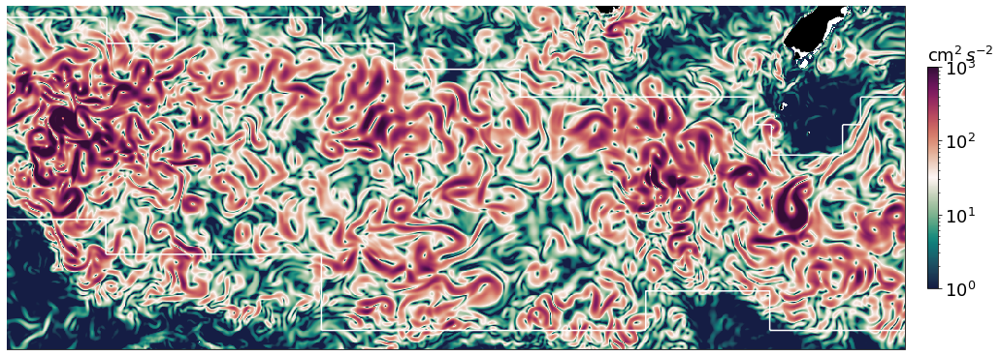

In [20]:
## snapshots

fig, axs = plt.subplots(figsize=(20,14), subplot_kw = {'projection': ccrs.Mercator()})

map1 = (eke_10.isel(time_counter =7)* 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), cmap= cm.curl)

# (eke_10_base.sel(time_counter ='2010') * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
#                                add_colorbar= False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), #vmax=(eke_1_m * 1e4).max().values),
#                                cmap = cm.curl)

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='white', levels=[1], linewidth=10, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.3, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=18)

axs.set_extent([80, 180, -54, -43])
axs.coastlines()
axs.add_feature(cfeature.LAND, color='black')
c.ax.tick_params(labelsize=18)
axes.Axes.tick_params(axs, axis='both' ,labelsize=18)

axs.set_title(None)

# plt.savefig(savepath + 'EKE_snapshot_2010_r4_ORION.png', format='png', facecolor="w", bbox_inches='tight')

Text(0.5, 1.0, '')

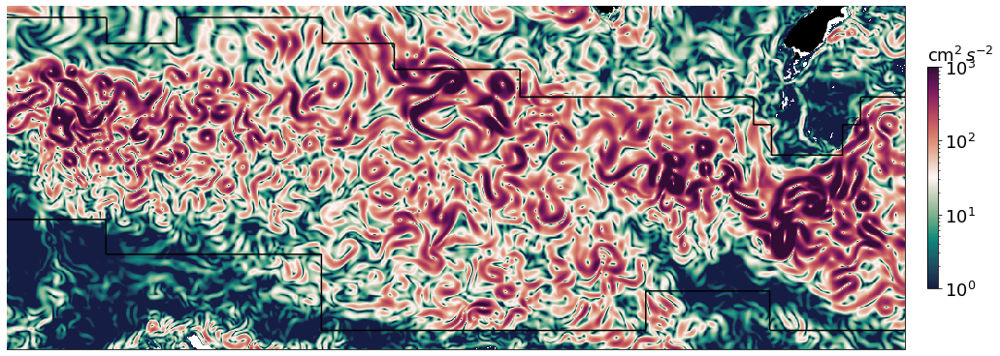

In [21]:
## snapshots

fig, axs = plt.subplots(figsize=(20,14), subplot_kw = {'projection': ccrs.Mercator()})

map1 = (eke_10X.isel(time_counter =7)* 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), cmap= cm.curl)

# (eke_10X_base.sel(time_counter ='2010') * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
#                                add_colorbar= False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), #vmax=(eke_1_m * 1e4).max().values),
#                                cmap = cm.curl)

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='k', levels=[1], linewidth=7, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.3, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=18)

# axs.set_extent([80, 180, -60, -35])
axs.set_extent([80, 180, -54, -43])

axs.coastlines()
axs.add_feature(cfeature.LAND, color='black')
c.ax.tick_params(labelsize=18)
axes.Axes.tick_params(axs, axis='both' ,labelsize=18)

axs.set_title(None)
# plt.savefig(savepath + 'EKE_snapshot_2010_r4_FOCI.png', format='png', facecolor="w", bbox_inches='tight')

Text(0.5, 1.0, '')

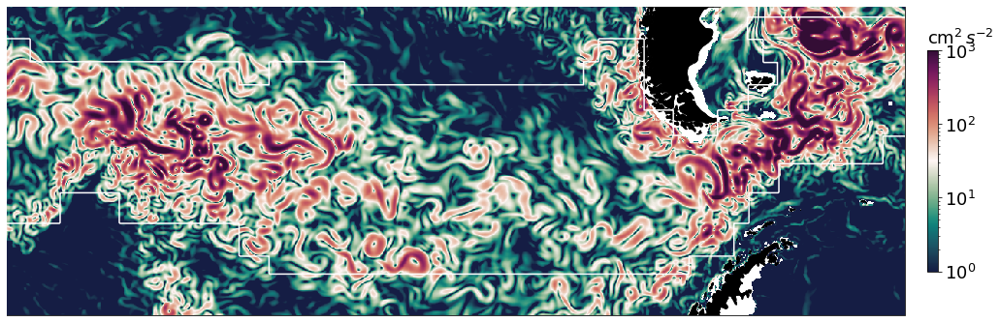

In [30]:
## snapshots

fig, axs = plt.subplots(figsize=(20,14), subplot_kw = {'projection': ccrs.Mercator()})

map1 = (eke_10.isel(time_counter =15)* 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), cmap= cm.curl)

# (eke_10_base.sel(time_counter ='2010') * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
#                                add_colorbar= False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), #vmax=(eke_1_m * 1e4).max().values),
#                                cmap = cm.curl)

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='white', levels=[1], linewidth=10, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.3, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=18)

axs.set_extent([-160, -40, -50, -45])
axs.coastlines()
axs.add_feature(cfeature.LAND, color='black')
c.ax.tick_params(labelsize=18)
axes.Axes.tick_params(axs, axis='both' ,labelsize=18)

axs.set_title(None)
# plt.savefig(savepath + 'EKE_snapshot_2010_drake_ORION.png', format='png', facecolor="w", bbox_inches='tight')

Text(0.5, 1.0, '')

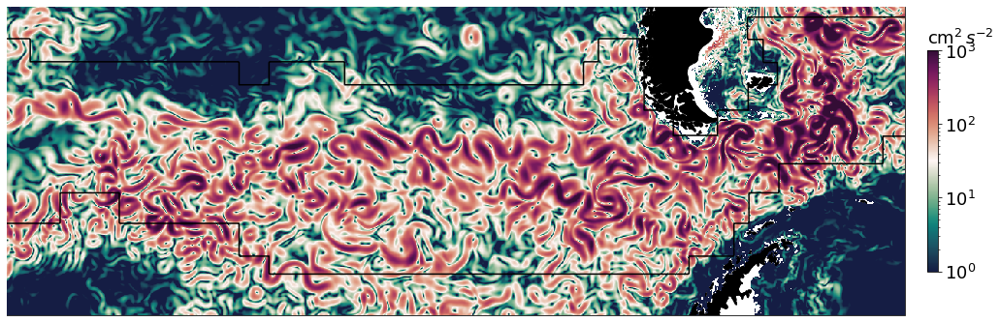

In [29]:
## snapshots

fig, axs = plt.subplots(figsize=(20,14), subplot_kw = {'projection': ccrs.Mercator()})

map1 = (eke_10X.isel(time_counter =15)* 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), cmap= cm.curl)

# (eke_10X_base.sel(time_counter ='2015') * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
#                                add_colorbar= False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), #vmax=(eke_1_m * 1e4).max().values),
#                                cmap = cm.curl)

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='k', levels=[1], linewidth=7, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.3, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=18)

axs.set_extent([-160, -40, -50, -45])
# axs.set_extent([80, 180, -65, -35])
axs.coastlines()
axs.add_feature(cfeature.LAND, color='black')
c.ax.tick_params(labelsize=18)
axes.Axes.tick_params(axs, axis='both' ,labelsize=18)

axs.set_title(None)
# plt.savefig(savepath + 'EKE_snapshot_2010_drake_FOCI.png', format='png', facecolor="w", bbox_inches='tight')

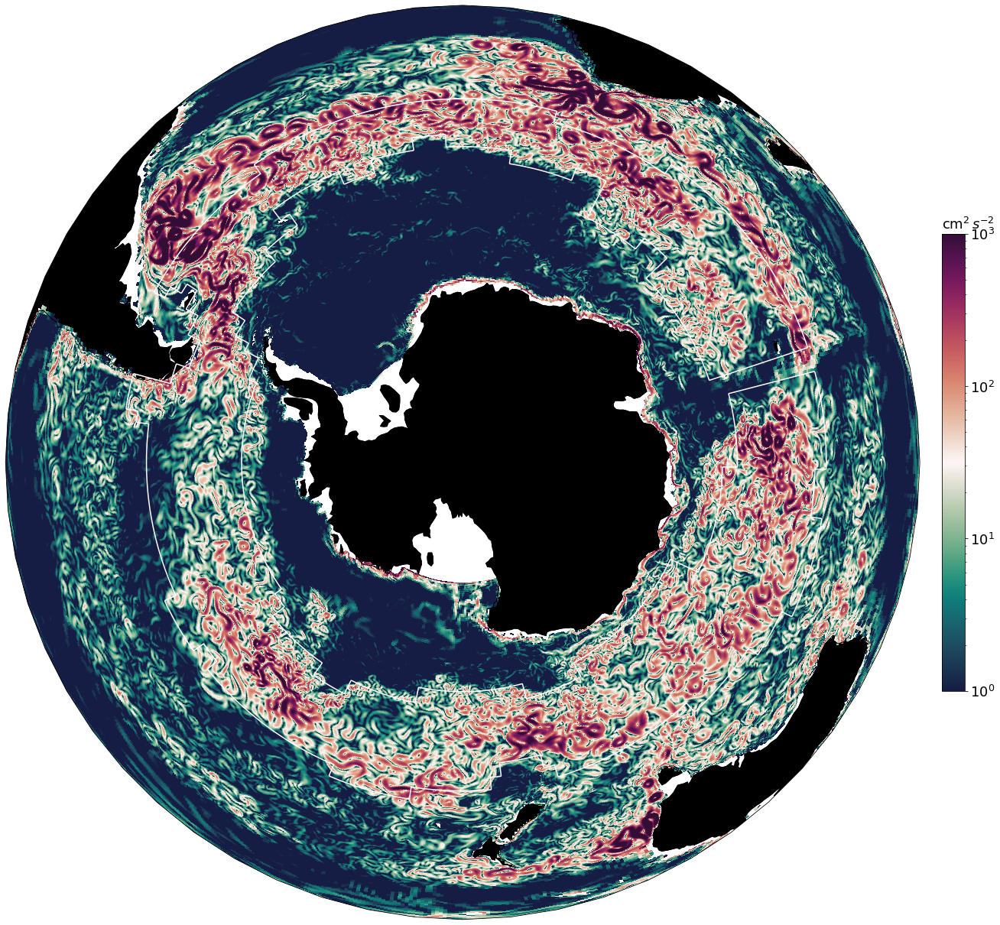

In [41]:
## snapshots

fig, axs = plt.subplots(figsize=(26,22), subplot_kw = {'projection': ccrs.NearsidePerspective(central_latitude = -90)})

map1 = (eke_10.isel(time_counter =15)* 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), cmap= cm.curl)

(eke_10_base.isel(time_counter =15) * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
                               add_colorbar= False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), #vmax=(eke_1_m * 1e4).max().values),
                               cmap = cm.curl)

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='white', levels=[1], linewidth=10, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.5, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=18)

axs.set_global()
axs.coastlines()
axs.add_feature(cfeature.LAND, color='black')
c.ax.tick_params(labelsize=18)
axes.Axes.tick_params(axs, axis='both' ,labelsize=18)

axs.set_title(None)

savepath = '/home/shkifmmp/_WORK/notebooks/shared-notebooks/master/figures/'
# plt.savefig(savepath + 'EKE_snapshot_2005_ORION.png', format='png', facecolor="w", bbox_inches='tight')

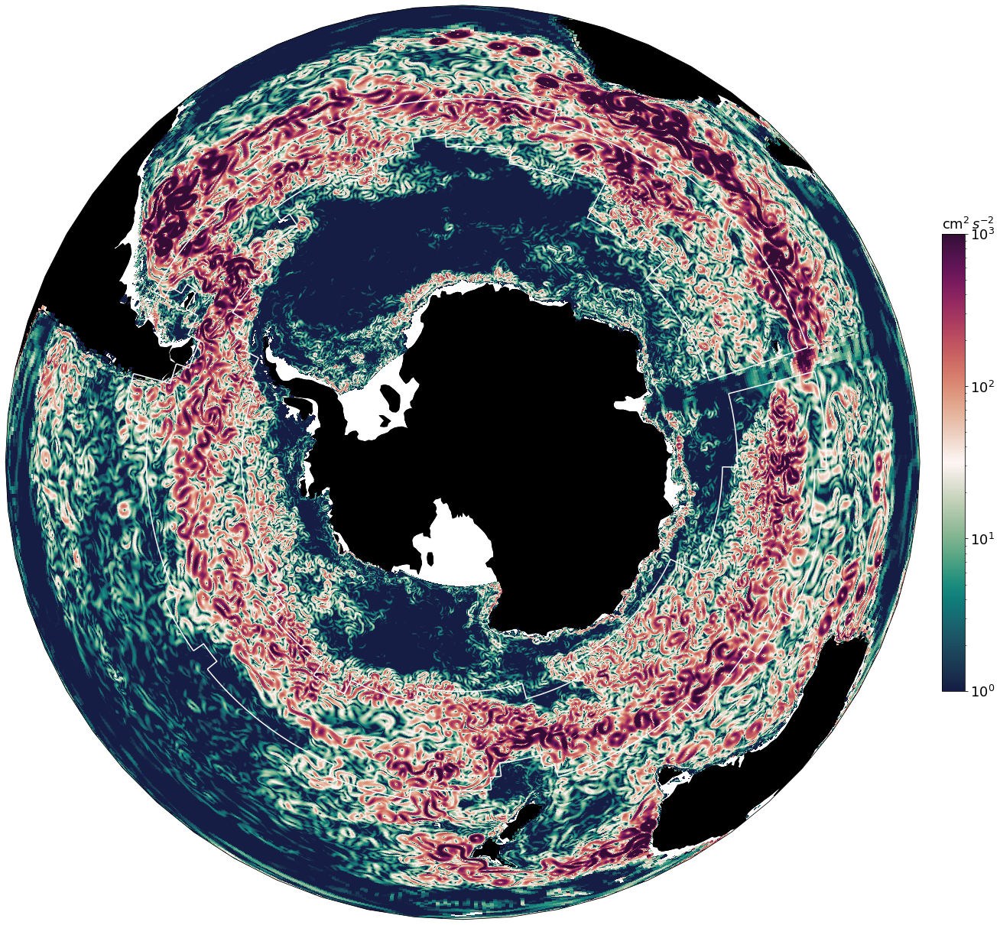

In [42]:
## snapshots

fig, axs = plt.subplots(figsize=(26,22), subplot_kw = {'projection': ccrs.NearsidePerspective(central_latitude = -90)})

map1 = (eke_10X.isel(time_counter =15)* 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), cmap= cm.curl)

(eke_10X_base.isel(time_counter =15) * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
                               add_colorbar= False, norm=colors.LogNorm(vmin=1e0, vmax=1e3), #vmax=(eke_1_m * 1e4).max().values),
                               cmap = cm.curl)

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='white', levels=[1], linewidth=10, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.5, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=18)

axs.set_global()
axs.coastlines()
axs.add_feature(cfeature.LAND, color='black')
c.ax.tick_params(labelsize=18)
axes.Axes.tick_params(axs, axis='both' ,labelsize=18)

axs.set_title(None)

savepath = '/home/shkifmmp/_WORK/notebooks/shared-notebooks/master/figures/'
# plt.savefig(savepath + 'EKE_snapshot_2005_FOCI.png', format='png', facecolor="w", bbox_inches='tight')

In [ ]:
## snapshots

fig, axs = plt.subplots(figsize=(16,12), subplot_kw = {'projection': ccrs.NearsidePerspective(central_latitude = -90)})

map1 = ((eke_10.sel(time_counter ='2005')* 1e4)- (eke_PLOT* 1e4)).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False)#, norm=colors.LogNorm(vmin=1e-1, vmax=3000), cmap= cm.curl)

((eke_10_base.sel(time_counter ='2005') * 1e4)- (eke_10_base.sel(time_counter ='2005') * 1e4)).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
                               add_colorbar= False,# norm=colors.LogNorm(vmin=1e-1, vmax=3000), #vmax=(eke_1_m * 1e4).max().values),
                               cmap = cm.curl)

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='k', levels=[1], linewidth=7, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.5, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=18)

axs.set_global()
axs.coastlines()
axs.add_feature(cfeature.LAND, color='black')
c.ax.tick_params(labelsize=18)
axes.Axes.tick_params(axs, axis='both' ,labelsize=18)

axs.set_title(None)

savepath = '/home/shkifmmp/_WORK/notebooks/shared-notebooks/master/figures/'
# plt.savefig(savepath + 'EKE_maps_ORION10_maskapplied_5817.png', format='png', facecolor="w", bbox_inches='tight')

### Plotting

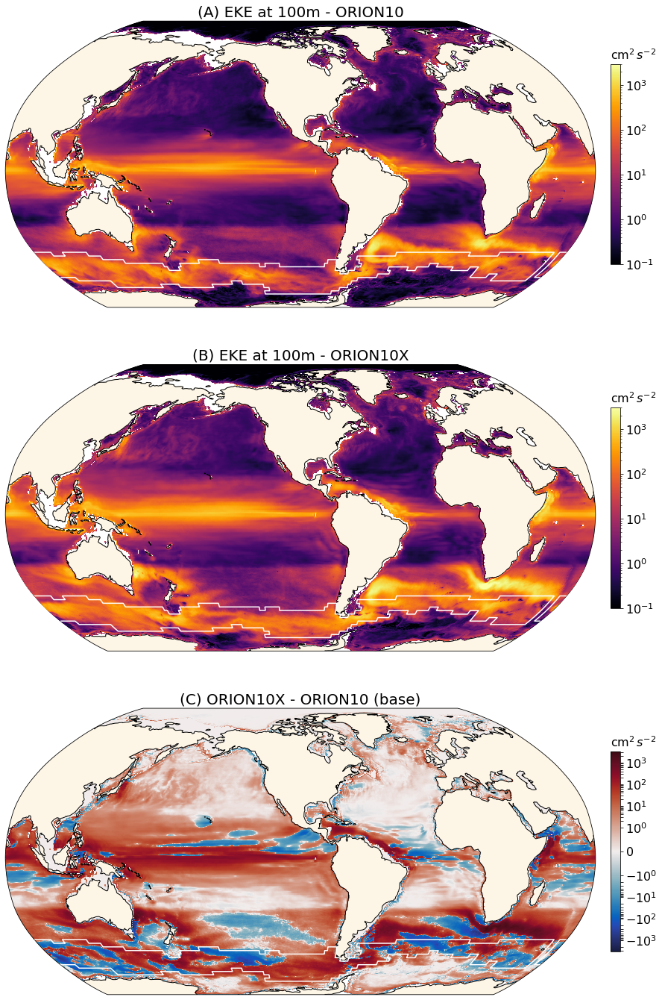

In [148]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(18,24), subplot_kw={'projection': ccrs.Robinson(central_longitude = -100)}, facecolor="none")

map1 = (mean_eke_10_b * 1e4).plot(x='nav_lon', y='nav_lat', transform=ccrs.PlateCarree(), add_colorbar=False, ax=axs[0], 
                             zorder=1, norm=colors.LogNorm(vmin=1e-1, vmax=3000),
                            cmap= 'inferno')

map2 = (mean_eke_10 * 1e4).plot(x='nav_lon', y='nav_lat', transform=ccrs.PlateCarree(), add_colorbar=False, ax=axs[0], 
                            norm=colors.LogNorm(vmin=1e-1, vmax=3000),
                            cmap= 'inferno', zorder=3)

# axs[0].contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
#             colors='white', levels=[1], linewidth=4, zorder=6)

map3 = (mean_eke_10X_b * 1e4).plot(x='nav_lon', y='nav_lat', transform=ccrs.PlateCarree(), add_colorbar=False, ax=axs[1], 
                             zorder=1, norm=colors.LogNorm(vmin=1e-1, vmax=3000),
                            cmap= 'inferno')

map4 = (mean_eke_10X * 1e4).plot(x='nav_lon', y='nav_lat', transform=ccrs.PlateCarree(), add_colorbar=False, ax=axs[1], 
                            norm=colors.LogNorm(vmin=1e-1, vmax=3000),
                            cmap= 'inferno', zorder=3)

map5 = ((mean_eke_10X_b - mean_eke_10_b) * 1e4).plot(x='nav_lon', y='nav_lat', transform=ccrs.PlateCarree(), add_colorbar=False, ax=axs[2], 
                             zorder=1, norm=colors.SymLogNorm(linthresh=1e0),
                            cmap= cm.balance)

for ax, maps in zip(axs, [map1, map3, map5]):
            c = plt.colorbar(maps, pad=0.02, shrink=0.7, ax=ax)
            c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=16)
            c.ax.tick_params(labelsize=16)
            axes.Axes.tick_params(ax, axis='both' ,labelsize=16)
            ax.coastlines()
            ax.add_feature(cfeature.LAND, color='oldlace')
            ax.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
                            colors='white', levels=[1], linewidth=4, zorder=6)
            
axs[0].set_title('(A) EKE at 100m - ORION10', fontsize=20)
axs[1].set_title('(B) EKE at 100m - ORION10X', fontsize=20)
axs[2].set_title('(C) ORION10X - ORION10 (base)', fontsize=20)

savepath = '/home/shkifmmp/_WORK/notebooks/shared-notebooks/master/figures/'
# plt.savefig(savepath + 'EKE_maps_ORION10_X_maskapplied.png', format='png', facecolor="w", bbox_inches='tight')

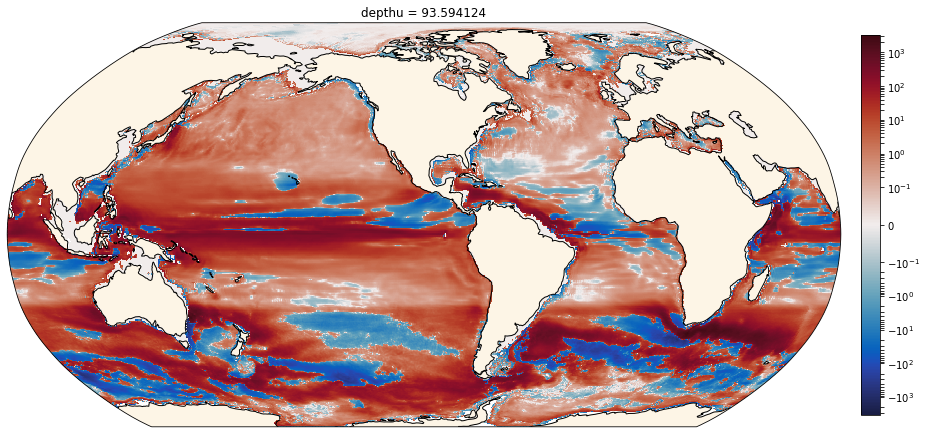

In [125]:
fig, axs = plt.subplots(figsize=(18,10), subplot_kw={'projection': ccrs.Robinson(central_longitude = -100)}, facecolor="none")

map5 = ((mean_eke_10X_b - mean_eke_10_b) * 1e4).plot(x='nav_lon', y='nav_lat', transform=ccrs.PlateCarree(), add_colorbar=False, ax=axs, 
                             zorder=1, norm=colors.SymLogNorm(linthresh=1e-1),
                            cmap= cm.balance)

c = plt.colorbar(map5, pad=0.02, shrink=0.7, ax=axs)

axs.coastlines()
axs.add_feature(cfeature.LAND, color='oldlace')

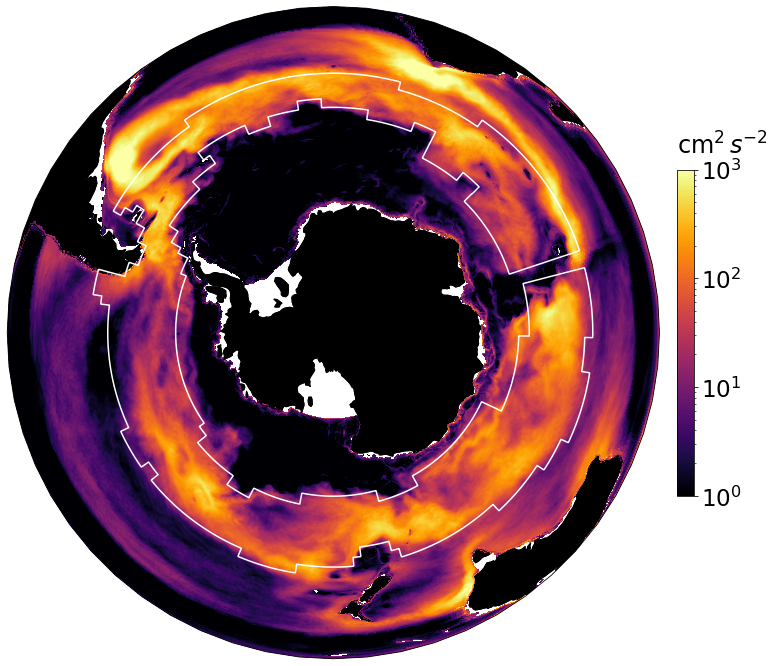

In [66]:
fig, axs = plt.subplots(figsize=(16,12), subplot_kw = {'projection': ccrs.NearsidePerspective(central_latitude = -90)})

map1 = (mean_eke_10 * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False, norm=colors.LogNorm(vmin=1e0, vmax=1000), cmap= 'inferno')

(mean_eke_10_b * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
                               add_colorbar= False, norm=colors.LogNorm(vmin=1e-0, vmax=1000), #vmax=(eke_1_m * 1e4).max().values),
                               cmap = 'inferno')

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='white', levels=[1], linewidth=15, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.5, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=24, y=1.03)

axs.set_global()
axs.coastlines()
axs.add_feature(cfeature.LAND, color='black')
c.ax.tick_params(labelsize=23)
# axes.Axes.tick_params(axs, axis='both' ,labelsize=24)

axs.set_title(None)

savepath = '/home/shkifmmp/_WORK/notebooks/shared-notebooks/master/figures/'
plt.savefig(savepath + 'EKE_maps_ORION10_maskapplied_9817.png', format='png', facecolor="w", bbox_inches='tight')

In [ ]:
c.ax.set_title?

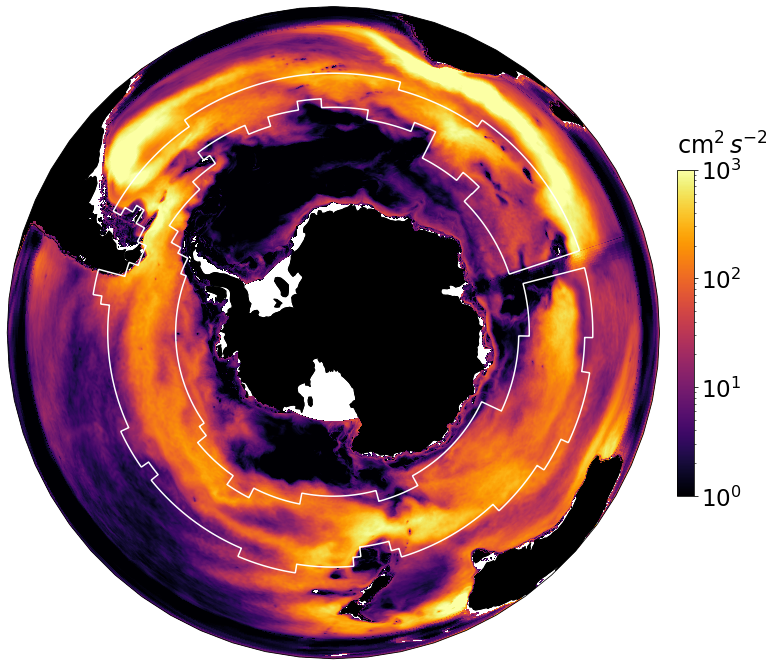

In [73]:
fig, axs = plt.subplots(figsize=(16,12), subplot_kw = {'projection': ccrs.NearsidePerspective(central_latitude = -90)})

map1 = (mean_eke_10X * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False, norm=colors.LogNorm(vmin=1e0, vmax=1000), cmap= 'inferno')

(mean_eke_10X_b * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
                               add_colorbar= False, norm=colors.LogNorm(vmin=1e-0, vmax=1000), #vmax=(eke_1_m * 1e4).max().values),
                               cmap = 'inferno')

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='white', levels=[1], linewidth=15, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.5, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=24, y=1.03)

axs.set_global()
axs.coastlines()
axs.add_feature(cfeature.LAND, color='black')
c.ax.tick_params(labelsize=23)
# axes.Axes.tick_params(axs, axis='both' ,labelsize=23)

axs.set_title(None)

savepath = '/home/shkifmmp/_WORK/notebooks/shared-notebooks/master/figures/'
plt.savefig(savepath + 'EKE_maps_ORION10X_maskapplied_9817.png', format='png', facecolor="w", bbox_inches='tight')

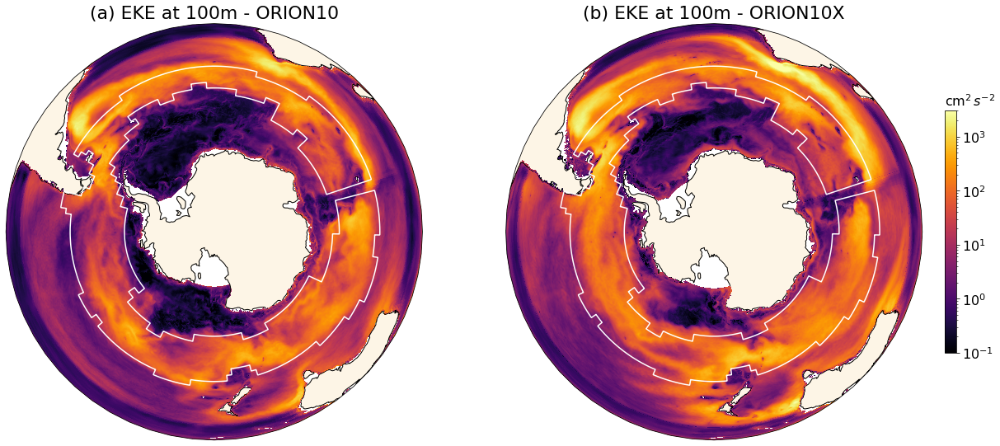

In [69]:
# fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(24,18), subplot_kw = {'projection': ccrs.NearsidePerspective(central_latitude = -90)})

# map1 = (mean_eke_10 * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs[0], zorder = 3, 
#                add_colorbar=False, norm=colors.LogNorm(vmin=1e-1, vmax=3000), cmap= 'inferno')

# (mean_eke_10_b * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs[0], zorder = 1,
#                                add_colorbar= False, norm=colors.LogNorm(vmin=1e-1, vmax=3000), #vmax=(eke_1_m * 1e4).max().values),
#                                cmap = 'inferno')

# map2 = (mean_eke_10X * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs[1], zorder = 3, 
#                add_colorbar=False, norm=colors.LogNorm(vmin=1e-1, vmax=3000), cmap= 'inferno')

# (mean_eke_10X_b * 1e4).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs[1], zorder = 1,
#                                add_colorbar= False, norm=colors.LogNorm(vmin=1e-1, vmax=3000), #vmax=(eke_1_m * 1e4).max().values),
#                                cmap = 'inferno')


# for ax, maps in zip(axs, [map1, map2]):
#     ax.set_global()
#     ax.coastlines()
#     ax.add_feature(cfeature.LAND, color='oldlace')
#     ax.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
#                colors='white', levels=[1], linewidth=4, zorder=6)

# c = plt.colorbar(map2, pad=0.02, shrink=0.3, ax=axs[0:2])
# c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=16)
# c.ax.tick_params(labelsize=16)
# axes.Axes.tick_params(ax, axis='both' ,labelsize=16)            

# axs[0].set_title('(a) EKE at 100m - ORION10', fontsize=22)
# axs[1].set_title('(b) EKE at 100m - ORION10X', fontsize=22)

# # plt.subplots_adjust(wspace=0.1)
# # plt.tight_layout()

# savepath = '/home/shkifmmp/_WORK/notebooks/shared-notebooks/master/figures/'
# # plt.savefig(savepath + 'EKE_maps_ORION10_maskapplied.png', format='png', facecolor="w", bbox_inches='tight')

### map difference - whole time series

In [46]:
mean_eke_10Xb = mean_eke_10X.isel(y=slice(295,922), x=slice(None, -1))

mean_eke_10Xb.coords['y'] = mean_eke_10.coords['y'].values

mean_eke_10Xb.coords['x'] = mean_eke_10.coords['x'].values

mean_eke_10Xb.coords['nav_lon'].values = mean_eke_10.coords['nav_lon'].values

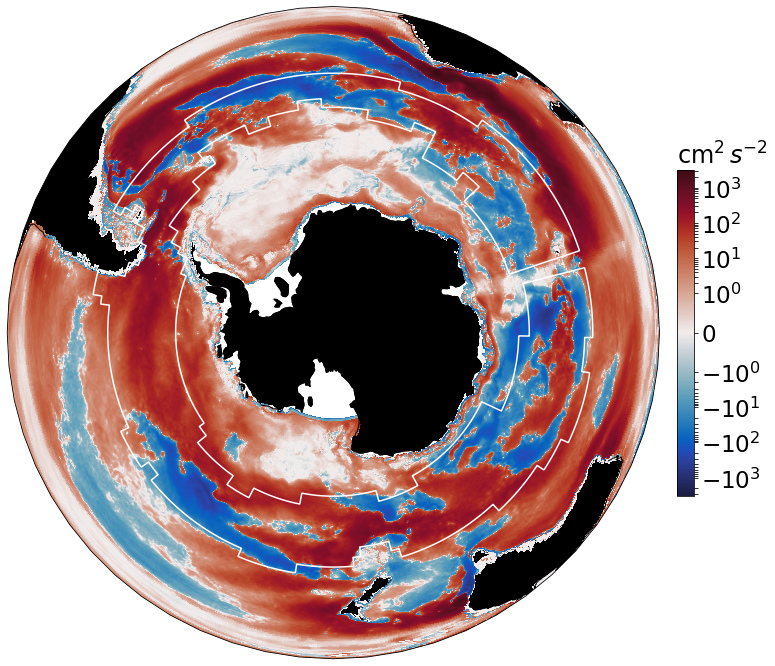

In [74]:
fig, axs = plt.subplots(figsize=(16,12), subplot_kw = {'projection': ccrs.NearsidePerspective(central_latitude = -90)})

map1 = ((mean_eke_10Xb * 1e4) - (mean_eke_10 * 1e4)).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False, norm=colors.SymLogNorm(linthresh=1e0), cmap= cm.balance)

((mean_eke_10X_b * 1e4) - (mean_eke_10_b * 1e4)).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
                               add_colorbar= False, norm=colors.SymLogNorm(linthresh=1e0), #vmax=(eke_1_m * 1e4).max().values),
                               cmap = cm.balance)

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='white', levels=[1], linewidth=15, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.5, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=24)

axs.set_global()
axs.coastlines()
axs.add_feature(cfeature.LAND, color='black')
c.ax.tick_params(labelsize=23)
# c.ax.set_yticklabels(['< -1', '0', '> 1'])
# axes.Axes.tick_params(axs, axis='both' ,labelsize=18)
axs.set_title(None)

savepath = '/home/shkifmmp/_WORK/notebooks/shared-notebooks/master/figures/'
plt.savefig(savepath + 'EKE_maps_FO-OR_diff_9817.png', format='png', facecolor="w", bbox_inches='tight')

In [35]:
mean_eke_10Xb_3p = mean_eke_10X_3p.isel(y=slice(295,922), x=slice(None, -1))

mean_eke_10Xb_3p.coords['y'] = mean_eke_10_3p.coords['y'].values

mean_eke_10Xb_3p.coords['x'] = mean_eke_10_3p.coords['x'].values

mean_eke_10Xb_3p.coords['nav_lon'].values = mean_eke_10_3p.coords['nav_lon'].values

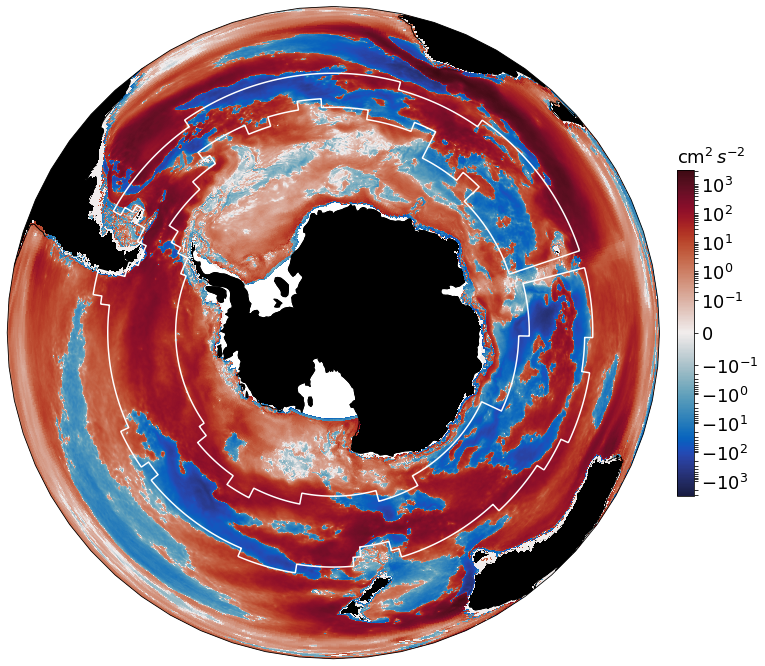

In [39]:
fig, axs = plt.subplots(figsize=(16,12), subplot_kw = {'projection': ccrs.NearsidePerspective(central_latitude = -90)})

map1 = ((mean_eke_10Xb_3p * 1e4) - (mean_eke_10_3p * 1e4)).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 3, 
               add_colorbar=False, norm=colors.SymLogNorm(linthresh=1e-1), cmap= cm.balance)

((mean_eke_10X_b_3p * 1e4) - (mean_eke_10_b_3p * 1e4)).plot(x='nav_lon', y='nav_lat', transform = ccrs.PlateCarree(), ax= axs, zorder = 1,
                               add_colorbar= False, norm=colors.SymLogNorm(linthresh=1e-1), #vmax=(eke_1_m * 1e4).max().values),
                               cmap = cm.balance)

axs.contour(mask_acc.nav_lon, mask_acc.nav_lat, mask_plot, transform= ccrs.PlateCarree(),
            colors='white', levels=[1], linewidth=7, zorder=7)

c = plt.colorbar(map1, pad=0.02, shrink=0.5, ax=axs)
c.ax.set_title('cm$^{2}\,s^{-2}$', loc='left', fontsize=18)

axs.set_global()
axs.coastlines()
axs.add_feature(cfeature.LAND, color='k')
c.ax.tick_params(labelsize=18)
axes.Axes.tick_params(axs, axis='both' ,labelsize=18)
axs.set_title(None)
# axs.set_title('EKE at 100m 1998-2017 (Uncoupled - Coupled)', fontsize=22, pad=20)

savepath = '/home/shkifmmp/_WORK/notebooks/shared-notebooks/master/figures/'
plt.savefig(savepath + 'EKE_maps_FO-OR_diff_black_9817.png', format='png', facecolor="w", bbox_inches='tight')

In [128]:
mean_eke_10_3p

<xarray.DataArray 'vozocrtx' (y: 627, x: 3562)>
array([[0.00016408, 0.00021233, 0.00028604, ..., 0.00042394, 0.00045837,
        0.00043683],
       [0.00014771, 0.00019553, 0.00025302, ..., 0.00047359, 0.00051015,
        0.00047621],
       [0.00015499, 0.00019334, 0.00023504, ..., 0.00055252, 0.00059188,
        0.00051939],
       ...,
       [0.00026393, 0.00028004, 0.0003014 , ..., 0.00028837, 0.00030499,
        0.00015921],
       [0.00026756, 0.00028048, 0.00030029, ..., 0.00027331, 0.00028136,
        0.00015301],
       [0.00010286, 0.00010472, 0.00010852, ..., 0.00011386, 0.00011645,
        0.        ]], dtype=float32)
Coordinates:
    nav_lon  (y, x) float64 75.5 75.6 75.7 75.8 75.9 ... 431.3 431.4 431.5 431.6
    nav_lat  (y, x) float32 -67.98 -67.98 -67.98 -67.98 ... -29.76 -29.76 -29.76
    depthu   float32 93.59
  * x        (x) int64 1 2 3 4 5 6 7 8 ... 3556 3557 3558 3559 3560 3561 3562
  * y        (y) int64 1 2 3 4 5 6 7 8 9 ... 619 620 621 622 623 624 625 626 627

In [129]:
mean_eke_10X_3p

<xarray.DataArray 'vozocrtx' (y: 943, x: 3563)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [0.00035744, 0.00035526, 0.00036531, ..., 0.00033017, 0.0001424 ,
               nan],
       [0.00019211, 0.00019603, 0.00020146, ..., 0.00016024, 0.        ,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan]], dtype=float32)
Coordinates:
    nav_lon  (y, x) float64 75.5 75.6 75.7 75.8 75.9 ... 431.4 431.5 431.6 431.7
    nav_lat  (y, x) float32 -76.74 -76.74 -76.74 -76.74 ... -27.92 -27.92 -27.92
    depthu   float32 93.59
  * x        (x) int64 1 2 3 4 5 6 7 8 ... 3557 3558 3559 3560 3561 3562 3563
  * y        (y) int64 1 2 3 4 5 6 7 8 9 ... 935 936 937 938 939 940 941 942 943

In [79]:
mean_eke_10_b 

<xarray.DataArray 'vozocrtx' (y: 510, x: 721)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    nav_lon  (y, x) float64 73.5 74.0 74.5 75.0 75.5 ... 433.0 433.0 433.0 433.0
    nav_lat  (y, x) float32 -76.9 -76.9 -76.9 -76.9 ... 50.12 50.02 50.0 50.02
    depthu   float32 93.59
  * x        (x) int64 1 2 3 4 5 6 7 8 9 ... 713 714 715 716 717 718 719 720 721
  * y        (y) int64 1 2 3 4 5 6 7 8 9 ... 502 503 504 505 506 507 508 509 510

In [72]:
mean_eke_10Xb

<xarray.DataArray 'vozocrtx' (y: 627, x: 3562)>
array([[1.5177089e-04, 1.3187193e-04, 1.2522178e-04, ..., 3.5612888e-04,
        4.0514171e-04, 4.3142706e-04],
       [1.2187818e-04, 1.1062033e-04, 1.0616309e-04, ..., 3.5632800e-04,
        3.9575607e-04, 4.2260395e-04],
       [1.0815500e-04, 9.7624645e-05, 9.2606526e-05, ..., 3.7429514e-04,
        4.2084459e-04, 4.1508322e-04],
       ...,
       [4.7484585e-04, 4.9122371e-04, 5.2009209e-04, ..., 6.3327642e-04,
        5.6747359e-04, 1.9533248e-04],
       [4.6690376e-04, 4.7669958e-04, 5.0405617e-04, ..., 6.1696634e-04,
        5.4118212e-04, 2.0376102e-04],
       [4.5412389e-04, 4.6540244e-04, 4.9020816e-04, ..., 6.1338808e-04,
        5.3661986e-04, 1.9268136e-04]], dtype=float32)
Coordinates:
    nav_lon  (y, x) float64 75.5 75.6 75.7 75.8 75.9 ... 431.3 431.4 431.5 431.6
    nav_lat  (y, x) float32 -67.98 -67.98 -67.98 -67.98 ... -29.76 -29.76 -29.76
    depthu   float32 93.59
  * x        (x) int64 1 2 3 4 5 6 7 8 ... 3556 3557 3558 3559 3560 3561 3562
  * y        (y) int64 1 2 3 4 5 6 7 8 9 ... 619 620 621 622 623 624 625 626 627

In [68]:
xr.align(mean_eke_10,mean_eke_10Xb, join='exact')

(<xarray.DataArray 'vozocrtx' (y: 627, x: 3562)>
 array([[0.00018234, 0.00023888, 0.00032285, ..., 0.00044083, 0.00048017,
         0.00045998],
        [0.00015925, 0.00021197, 0.00027872, ..., 0.0004895 , 0.00053191,
         0.00050084],
        [0.00016018, 0.00020294, 0.00025304, ..., 0.0005671 , 0.0006131 ,
         0.00054539],
        ...,
        [0.0002784 , 0.00029744, 0.00032035, ..., 0.00030068, 0.00031681,
         0.00016615],
        [0.0002836 , 0.00029892, 0.00032058, ..., 0.00028375, 0.00029066,
         0.00016229],
        [0.0001031 , 0.00010541, 0.00010969, ..., 0.00011084, 0.0001132 ,
         0.        ]], dtype=float32)
 Coordinates:
     nav_lon  (y, x) float64 75.5 75.6 75.7 75.8 75.9 ... 431.3 431.4 431.5 431.6
     nav_lat  (y, x) float32 -67.98 -67.98 -67.98 -67.98 ... -29.76 -29.76 -29.76
     depthu   float32 93.59
   * x        (x) int64 1 2 3 4 5 6 7 8 ... 3556 3557 3558 3559 3560 3561 3562
   * y        (y) int64 1 2 3 4 5 6 7 8 9 ... 619 620 621 622

In [131]:
mean_eke_10_3p - mean_eke_10Xb_3p

<xarray.DataArray 'vozocrtx' (y: 627, x: 3562)>
array([[ 1.09112589e-05,  8.27530748e-05,  1.66099242e-04, ...,
        -1.19247998e-05, -3.85946769e-05, -9.50478425e-05],
       [ 2.77213039e-05,  8.89073053e-05,  1.53104673e-04, ...,
         3.48984613e-05,  2.21783121e-05, -4.71833337e-05],
       [ 5.09384699e-05,  1.00617704e-04,  1.48771971e-04, ...,
         9.01269668e-05,  7.29003223e-05,  3.01678665e-06],
       ...,
       [-2.15598353e-04, -2.28936609e-04, -2.51165038e-04, ...,
        -3.56494245e-04, -2.81714689e-04, -5.77614846e-05],
       [-2.05341115e-04, -2.11205275e-04, -2.30164733e-04, ...,
        -3.59538972e-04, -2.83114670e-04, -7.29484018e-05],
       [-3.63992294e-04, -3.77663644e-04, -4.05027560e-04, ...,
        -5.17549342e-04, -4.45101585e-04, -2.16495100e-04]], dtype=float32)
Coordinates:
    nav_lon  (y, x) float64 75.5 75.6 75.7 75.8 75.9 ... 431.3 431.4 431.5 431.6
    nav_lat  (y, x) float32 -67.98 -67.98 -67.98 -67.98 ... -29.76 -29.76 -29.76
    depthu   float32 93.59
  * x        (x) int64 1 2 3 4 5 6 7 8 ... 3556 3557 3558 3559 3560 3561 3562
  * y        (y) int64 1 2 3 4 5 6 7 8 9 ... 619 620 621 622 623 624 625 626 627